# NLP-Sentimental Analysis 

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import spacy 
from spacy import displacy
import string
from wordcloud import WordCloud

In [2]:
df=pd.read_csv("Elon_musk.csv",encoding="latin1")
df.head()

,Unnamed: 0,Text
0,1,@kunalb11 Im an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...


## EDA

In [3]:
df.columns

Index(['Unnamed: 0', 'Text'], dtype='object')

In [4]:
df.drop("Unnamed: 0",axis=1,inplace=True)

In [5]:
df.head()

,Text
0,@kunalb11 Im an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1999 entries, 0 to 1998
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    1999 non-null   object
dtypes: object(1)
memory usage: 15.7+ KB


In [7]:
df.shape

(1999, 1)

## Removing leading and trailing spaces

In [8]:
sentences=df["Text"].str.strip().tolist() 
sentences[:10]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely']

## Removing empty strings

In [9]:
sentences=[i for i in sentences if i]
sentences[:10]

['@kunalb11 I\x92m an alien',
 '@ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated',
 '@teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!!',
 'Happy New Year of the Ox! https://t.co/9WFKMYu2oj',
 'Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM',
 '@OwenSparks_ @flcnhvy @anonyx10 Haha thanks :)',
 '@flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely']

## Joining all sentences to one string

In [10]:
sentences=" ".join(sentences)
sentences

'@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U

## Removing Punctuations

In [11]:
no_punctuation_senetences=sentences.translate(str.maketrans("","",string.punctuation))
no_punctuation_senetences

'kunalb11 I\x92m an alien IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it joerogan Spotify Great interview gtera27 Doge is underestimated teslacn Congratulations Tesla China for amazing execution last year Now on to the next for even more Happy New Year of the Ox httpstco9WFKMYu2oj Frodo was the underdoge\nAll thought he would fail\nHimself most of all httpstcozGxJFDzzrM OwenSparks flcnhvy anonyx10 Haha thanks  flcnhvy anonyx10 Indeed Tweets definitely do not represent realworld time allocation The most entertaining outcome is the most likely GiveDirectly Just sent some Just agree to do Clubhouse with kanyewest httpstco3rWE9uHSTS geoffkeighley UnrealEngine It\x92s getting real Bought some Dogecoin for lil X so he can be a toddler hodler JoshManMode He definitely has issues but the sentencing seems a bit high freewalletorg Thanks for fixing freewalletorg Please unlock my account AstroJordy U0001F923U0001F923 This is true power haha httpstcoFc9uhQSd7O freewal

## Word tokenization using spacy

In [12]:
nlp=spacy.load("en_core_web_md")
doc=nlp(no_punctuation_senetences)
tokens=[token.text for token in doc]
tokens[:10]

['kunalb11',
 'I\x92m',
 'an',
 'alien',
 'IDAACarmack',
 'Ray',
 'tracing',
 'on',
 'Cyberpunk',
 'with']

In [13]:
doc[:20]

kunalb11 Im an alien IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it joerogan Spotify Great

## Create stopwords list

In [14]:
stop_words=spacy.lang.en.stop_words.STOP_WORDS
stop_words

{"'d",
 "'ll",
 "'m",
 "'re",
 "'s",
 "'ve",
 'a',
 'about',
 'above',
 'across',
 'after',
 'afterwards',
 'again',
 'against',
 'all',
 'almost',
 'alone',
 'along',
 'already',
 'also',
 'although',
 'always',
 'am',
 'among',
 'amongst',
 'amount',
 'an',
 'and',
 'another',
 'any',
 'anyhow',
 'anyone',
 'anything',
 'anyway',
 'anywhere',
 'are',
 'around',
 'as',
 'at',
 'back',
 'be',
 'became',
 'because',
 'become',
 'becomes',
 'becoming',
 'been',
 'before',
 'beforehand',
 'behind',
 'being',
 'below',
 'beside',
 'besides',
 'between',
 'beyond',
 'both',
 'bottom',
 'but',
 'by',
 'ca',
 'call',
 'can',
 'cannot',
 'could',
 'did',
 'do',
 'does',
 'doing',
 'done',
 'down',
 'due',
 'during',
 'each',
 'eight',
 'either',
 'eleven',
 'else',
 'elsewhere',
 'empty',
 'enough',
 'even',
 'ever',
 'every',
 'everyone',
 'everything',
 'everywhere',
 'except',
 'few',
 'fifteen',
 'fifty',
 'first',
 'five',
 'for',
 'former',
 'formerly',
 'forty',
 'four',
 'from',
 'fron

## Removing stopwords from the tokens

In [15]:
tokens=[token for token in tokens if token not in stop_words]
tokens[:20]

['kunalb11',
 'I\x92m',
 'alien',
 'IDAACarmack',
 'Ray',
 'tracing',
 'Cyberpunk',
 'HDR',
 'nextlevel',
 'Have',
 'tried',
 'joerogan',
 'Spotify',
 'Great',
 'interview',
 'gtera27',
 'Doge',
 'underestimated',
 'teslacn',
 'Congratulations']

## Convert all tokens to lowercase

In [16]:
tokens=[token.lower()  for token in tokens]
tokens[:20]

['kunalb11',
 'i\x92m',
 'alien',
 'idaacarmack',
 'ray',
 'tracing',
 'cyberpunk',
 'hdr',
 'nextlevel',
 'have',
 'tried',
 'joerogan',
 'spotify',
 'great',
 'interview',
 'gtera27',
 'doge',
 'underestimated',
 'teslacn',
 'congratulations']

# Reducing the tokens to their root form(Lemmatization)

In [17]:
lemmas=[token.lemma_ for token in doc]
lemmas

['kunalb11',
 'I\x92m',
 'an',
 'alien',
 'IDAACarmack',
 'Ray',
 'trace',
 'on',
 'cyberpunk',
 'with',
 'HDR',
 'be',
 'nextlevel',
 'have',
 'you',
 'try',
 'it',
 'joerogan',
 'Spotify',
 'great',
 'interview',
 'gtera27',
 'Doge',
 'be',
 'underestimate',
 'teslacn',
 'Congratulations',
 'Tesla',
 'China',
 'for',
 'amazing',
 'execution',
 'last',
 'year',
 'now',
 'on',
 'to',
 'the',
 'next',
 'for',
 'even',
 'more',
 'happy',
 'New',
 'Year',
 'of',
 'the',
 'Ox',
 'httpstco9WFKMYu2oj',
 'Frodo',
 'be',
 'the',
 'underdoge',
 '\n',
 'all',
 'think',
 'he',
 'would',
 'fail',
 '\n',
 'himself',
 'most',
 'of',
 'all',
 'httpstcozgxjfdzzrm',
 'OwenSparks',
 'flcnhvy',
 'anonyx10',
 'Haha',
 'thank',
 ' ',
 'flcnhvy',
 'anonyx10',
 'indeed',
 'Tweets',
 'definitely',
 'do',
 'not',
 'represent',
 'realworld',
 'time',
 'allocation',
 'the',
 'most',
 'entertaining',
 'outcome',
 'be',
 'the',
 'most',
 'likely',
 'GiveDirectly',
 'just',
 'send',
 'some',
 'just',
 'agree',
 'to

## Feature Extraction - Count Vectorization

In [18]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
x=cv.fit_transform(lemmas)

In [19]:
cv.vocabulary_

{'kunalb11': 2714,
 'an': 267,
 'alien': 232,
 'idaacarmack': 2450,
 'ray': 3634,
 'trace': 4506,
 'on': 3260,
 'cyberpunk': 969,
 'with': 4904,
 'hdr': 1688,
 'be': 470,
 'nextlevel': 3168,
 'have': 1681,
 'you': 4957,
 'try': 4542,
 'it': 2582,
 'joerogan': 2633,
 'spotify': 4128,
 'great': 1622,
 'interview': 2559,
 'gtera27': 1640,
 'doge': 1122,
 'underestimate': 4675,
 'teslacn': 4350,
 'congratulations': 862,
 'tesla': 4344,
 'china': 744,
 'for': 1470,
 'amazing': 257,
 'execution': 1336,
 'last': 2733,
 'year': 4949,
 'now': 3208,
 'to': 4465,
 'the': 4395,
 'next': 3167,
 'even': 1307,
 'more': 3076,
 'happy': 1668,
 'new': 3164,
 'of': 3244,
 'ox': 3328,
 'httpstco9wfkmyu2oj': 1877,
 'frodo': 1507,
 'underdoge': 4674,
 'all': 234,
 'think': 4423,
 'he': 1689,
 'would': 4924,
 'fail': 1372,
 'himself': 1733,
 'most': 3081,
 'httpstcozgxjfdzzrm': 2410,
 'owensparks': 3324,
 'flcnhvy': 1449,
 'anonyx10': 286,
 'haha': 1654,
 'thank': 4388,
 'indeed': 2499,
 'tweets': 4564,
 'de

In [20]:
pd.DataFrame(cv.vocabulary_,index=["count"]).T.sort_values(by="count",ascending=False)

,count
ðogecoin,4982
zzcool,4981
zwiebelbach,4980
zubinanary,4979
zshauladventure,4978
...,...
10000,4
1000,3
100,2
10,1


In [21]:
x.shape

(21635, 4983)

## Include bigrams and trigrams in addition to unigrams

In [22]:
cv_ngrams=CountVectorizer(ngram_range=(1,3))
bow_matrix_ngram=cv_ngrams.fit_transform(lemmas)

In [23]:
cv_ngrams.get_feature_names()

C:\Users\Sachin Ganapathy\Anaconda3\envs\nlp\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['005',
 '10',
 '100',
 '1000',
 '10000',
 '107',
 '10x',
 '11',
 '112',
 '11thhour',
 '12',
 '122',
 '13',
 '130pm',
 '13arm13arm',
 '13ericralph31',
 '14',
 '140pm',
 '149watt',
 '14yearold',
 '15',
 '150',
 '155',
 '16',
 '162',
 '17',
 '18',
 '1880s',
 '1b',
 '1matthewgarcia',
 '1st',
 '1stprinciples4l',
 '20',
 '200',
 '2007',
 '2008',
 '2009',
 '2012',
 '2017',
 '2020',
 '2021',
 '2024',
 '2026',
 '2030',
 '20k',
 '210',
 '218',
 '21st',
 '22',
 '225',
 '23',
 '230',
 '24',
 '240am',
 '247teslanew',
 '25',
 '250',
 '250kw',
 '25d',
 '25gunsteslacom',
 '25k',
 '25th',
 '28',
 '28delayslater',
 '28th',
 '29',
 '2k',
 '2nd',
 '2v',
 '30',
 '300',
 '301',
 '304',
 '304l',
 '31',
 '33',
 '330',
 '360',
 '37',
 '3800',
 '394',
 '39a',
 '3d',
 '3rd',
 '40',
 '400',
 '42',
 '420',
 '4227',
 '430',
 '43rd',
 '445pm',
 '448',
 '4530000',
 '45thspacewe',
 '4680',
 '479000',
 '48',
 '4d',
 '4th',
 '4thfromourstar',
 '50',
 '50000',
 '50k',
 '60',
 '60000',
 '65',
 '69420',
 '6f',
 '6k',
 '72

In [24]:
bow_matrix_ngram.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

## TF-IDF Vectorizer with upto trigram

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf=TfidfVectorizer(ngram_range=(1,3),norm="l2")
tfidf_matrix=tfidf.fit_transform(lemmas)

In [26]:
tfidf.get_feature_names_out()

array(['005', '10', '100', ..., 'zwiebelbach', 'zzcool', 'ðogecoin'],
      dtype=object)

In [27]:
pd.DataFrame(tfidf_matrix.toarray(),columns=tfidf.get_feature_names_out())

,005,10,100,1000,10000,107,10x,11,112,11thhour,...,zikryzamir,zip2,zogfotpik,zon,zone,zshauladventure,zubinanary,zwiebelbach,zzcool,ðogecoin
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21630,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21631,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21632,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21633,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Generating WordCloud

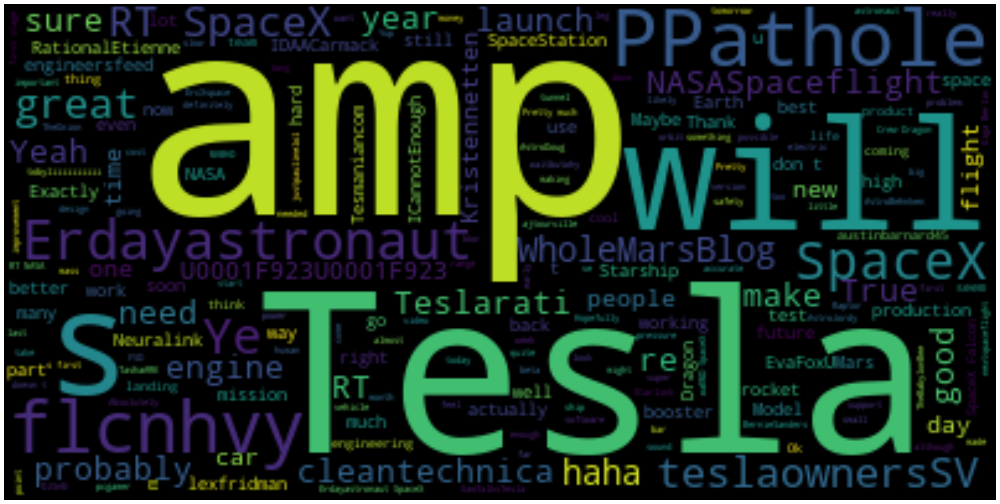

In [28]:
plt.figure(figsize=(30,30),dpi=300)
wordcloud=WordCloud().generate(no_punctuation_senetences)
plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show();

## Named Entity Recognition (NER)

In [29]:
displacy.render(doc,style="ent",jupyter=True)

## Parts of Speech Tagging (POS Tag)

In [30]:
word=[token.text for token in doc]
pos_tag=[token.pos_ for token in doc]
POS_df=pd.DataFrame({"word":word,"POS_TAG":pos_tag})
POS_df.head()

,word,POS_TAG
0,kunalb11,PROPN
1,Im,PROPN
2,an,DET
3,alien,ADJ
4,IDAACarmack,PROPN


## Nouns and Verbs 

In [31]:
nouns_verbs=[token.text for token in doc if token.pos_ in ["NOUN","VERB"]]
nouns_verbs[:10]

['tracing',
 'Cyberpunk',
 'tried',
 'interview',
 'gtera27',
 'underestimated',
 'teslacn',
 'execution',
 'year',
 'underdoge']

In [32]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
x=cv.fit_transform(nouns_verbs)

In [33]:
cv.vocabulary_

{'tracing': 2644,
 'cyberpunk': 564,
 'tried': 2661,
 'interview': 1366,
 'gtera27': 993,
 'underestimated': 2728,
 'teslacn': 2543,
 'execution': 789,
 'year': 2885,
 'underdoge': 2727,
 'thought': 2588,
 'fail': 814,
 'httpstcozgxjfdzzrm': 1276,
 'flcnhvy': 869,
 'thanks': 2564,
 'anonyx10': 114,
 'represent': 2107,
 'time': 2598,
 'allocation': 88,
 'outcome': 1805,
 'sent': 2253,
 'agree': 63,
 'do': 672,
 'geoffkeighley': 950,
 'getting': 954,
 'lil': 1505,
 'toddler': 2614,
 'hodler': 1068,
 'has': 1025,
 'issues': 1382,
 'sentencing': 2254,
 'seems': 2238,
 'bit': 252,
 'freewalletorg': 904,
 'fixing': 862,
 'unlock': 2739,
 'account': 32,
 'u0001f923u0001f923': 2714,
 'power': 1945,
 'haha': 1005,
 'crypto': 550,
 'wallet': 2800,
 'give': 960,
 'keys': 1428,
 'avoided': 195,
 'costs': 522,
 'app': 122,
 'sucks': 2462,
 'selected': 2241,
 'launch': 1462,
 'elements': 732,
 'mission': 1669,
 'httpstco3pwt': 1112,
 'predict': 1952,
 'cash': 364,
 'flow': 878,
 'starlink': 2407,
 '

In [34]:
nouns_verbs_df=pd.DataFrame(cv.vocabulary_,index=["count"]).T.sort_values("count",ascending=False)
nouns_verbs_df.tail()

,count
20k,4
1st,3
1b,2
140pm,1
130pm,0


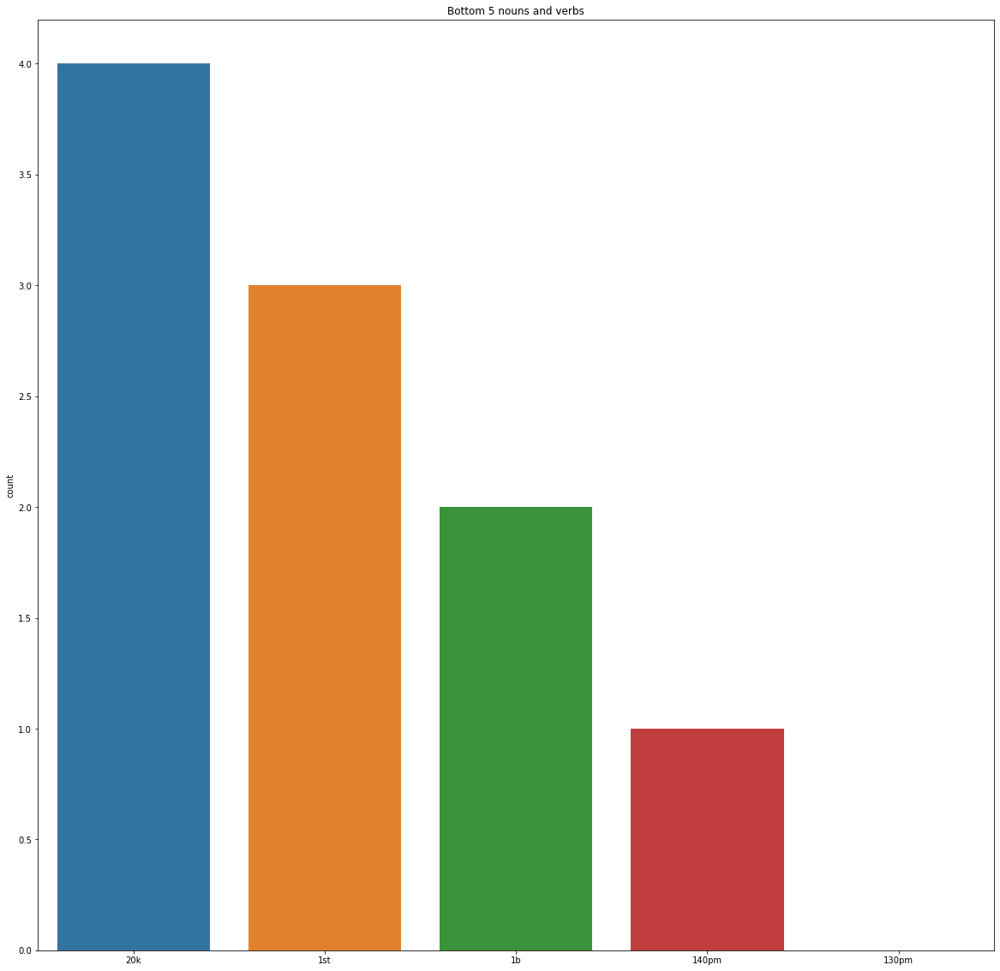

In [35]:
plt.figure(figsize=(20,20))
sns.barplot(data=nouns_verbs_df.tail(),x=nouns_verbs_df.tail().index,y="count")
plt.title("Bottom 5 nouns and verbs");

## Sentiment Analysis

In [36]:
afinn=pd.read_csv("Afinn.csv",encoding="latin1")
afinn.head()

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2


In [37]:
df=pd.read_csv("Elon_musk.csv",encoding="latin1")

df.drop("Unnamed: 0",axis=1,inplace=True)

sentences=df["Text"].str.strip().tolist() 

sentences=[i for i in sentences if i]

In [38]:
import nltk
nltk.download("punkt")

[nltk_data] Downloading package punkt to C:\Users\Sachin
[nltk_data]     Ganapathy\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Tokenization using NLTK

In [39]:
from nltk import tokenize
sentences_nltk=tokenize.sent_tokenize(" ".join(sentences))
sentences_nltk

['@kunalb11 I\x92m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level.',
 'Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year.',
 'Now on to the next for even more!!',
 'Happy New Year of the Ox!',
 'https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all.',
 'https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed!',
 'Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It\x92s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock 

In [40]:
sentences_df=pd.DataFrame(sentences_nltk,columns=["sentences"])
sentences_df.head()

,sentences
0,@kunalb11 Im an alien @ID_AA_Carmack Ray trac...
1,Have you tried it?
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated @teslacn Congr...
4,Now on to the next for even more!!


In [41]:
sentences_df["sentences"]=sentences_df["sentences"].str.translate(str.maketrans("","",string.punctuation))

sentences_df.head()

,sentences
0,kunalb11 Im an alien IDAACarmack Ray tracing ...
1,Have you tried it
2,joerogan Spotify Great interview
3,gtera27 Doge is underestimated teslacn Congrat...
4,Now on to the next for even more


In [42]:
sentences_df["sentences"]=[token for token in sentences_df["sentences"] if token not in stop_words]

sentences_df.head()

,sentences
0,kunalb11 Im an alien IDAACarmack Ray tracing ...
1,Have you tried it
2,joerogan Spotify Great interview
3,gtera27 Doge is underestimated teslacn Congrat...
4,Now on to the next for even more


In [43]:
sentences_df["sentences"]=[token.lower()  for token in sentences_df["sentences"]]
sentences_df.head()

,sentences
0,kunalb11 im an alien idaacarmack ray tracing ...
1,have you tried it
2,joerogan spotify great interview
3,gtera27 doge is underestimated teslacn congrat...
4,now on to the next for even more


In [44]:
afinn_scores=afinn.set_index("word")["value"].to_dict()
afinn_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

## Sentiment Scores

In [45]:
def sentiment_score(sentence):
    score=0
    sent_doc=nlp(sentence)
    for token in sent_doc:
        if token.text in afinn_scores:
            score+=afinn_scores[token.text]
    return score
            

In [46]:
sentiment_score("I am happy")

3

In [47]:
sentences_df["sentiment_score"]=sentences_df["sentences"].apply(sentiment_score)
sentences_df.head()

,sentences,sentiment_score
0,kunalb11 im an alien idaacarmack ray tracing ...,0
1,have you tried it,0
2,joerogan spotify great interview,3
3,gtera27 doge is underestimated teslacn congrat...,5
4,now on to the next for even more,0


In [48]:
sentences_df['word_count'] = sentences_df['sentences'].str.split().apply(len)
sentences_df['word_count'].head(10)

0     13
1      4
2      4
3     13
4      8
5      6
6     14
7      9
8      8
9    109
Name: word_count, dtype: int64

In [49]:
sentences_df.sort_values(by="sentiment_score")

,sentences,sentiment_score,word_count
647,very ba httpstcotjsh1exz1q justpaulinelol it...,-8,60
64,also the road to hell is mostly paved with bad...,-7,11
592,u0001f5a4 fallout radio u0001f5a4\nhttpstcogn...,-5,17
611,then static fire checkouts static fire fly to ...,-4,12
680,occasional flights from land are ok but freque...,-4,38
...,...,...,...
652,its not useful for predicting the future nor ...,13,118
645,its httpstcoixhyt6nuic teslarati tesla germa...,13,65
36,ajtourville erdayastronaut spacex yes but engi...,15,231
105,erdayastronaut spacex was also thinking that s...,16,94


## Sentiment Analysis of whole Data

In [50]:
sentences_df["sentiment_score"].describe()

count    924.000000
mean       1.580087
std        2.876865
min       -8.000000
25%        0.000000
50%        0.000000
75%        3.000000
max       17.000000
Name: sentiment_score, dtype: float64

## Negative Emotion 

In [51]:
sentences_df[sentences_df['sentiment_score']<=0]

,sentences,sentiment_score,word_count
0,kunalb11 im an alien idaacarmack ray tracing ...,0,13
1,have you tried it,0,4
4,now on to the next for even more,0,8
6,httpstco9wfkmyu2oj frodo was the underdoge\nal...,-2,14
8,tweets definitely do not represent realworld t...,0,8
...,...,...,...
919,kenyanwalstreet not actually a payout just a v...,0,11
920,it may never pay out as the stock cant b htt...,-2,31
921,details aug 28,0,3
922,ai symbiosis while u wait vistacruiser7 flcnhv...,-2,47


## Positive Emotion 

In [52]:
sentences_df[sentences_df['sentiment_score']>0]

,sentences,sentiment_score,word_count
2,joerogan spotify great interview,3,4
3,gtera27 doge is underestimated teslacn congrat...,5,13
5,happy new year of the ox,3,6
7,httpstcozgxjfdzzrm owensparks flcnhvy anonyx10...,5,9
9,the most entertaining outcome is the most like...,3,109
...,...,...,...
911,he was one of the very best,3,7
913,aliafshari in general we need to improve how p...,2,87
915,burakaydik true wow ihop amp github are close ...,7,15
917,this is both great amp terrifying,3,6


In [53]:
sentences_df['index']=range(0,len(sentences_df))
sentences_df

,sentences,sentiment_score,word_count,index
0,kunalb11 im an alien idaacarmack ray tracing ...,0,13,0
1,have you tried it,0,4,1
2,joerogan spotify great interview,3,4,2
3,gtera27 doge is underestimated teslacn congrat...,5,13,3
4,now on to the next for even more,0,8,4
...,...,...,...,...
919,kenyanwalstreet not actually a payout just a v...,0,11,919
920,it may never pay out as the stock cant b htt...,-2,31,920
921,details aug 28,0,3,921
922,ai symbiosis while u wait vistacruiser7 flcnhv...,-2,47,922


## Plotting the sentiment score for whole review

C:\Users\Sachin Ganapathy\Anaconda3\envs\nlp\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


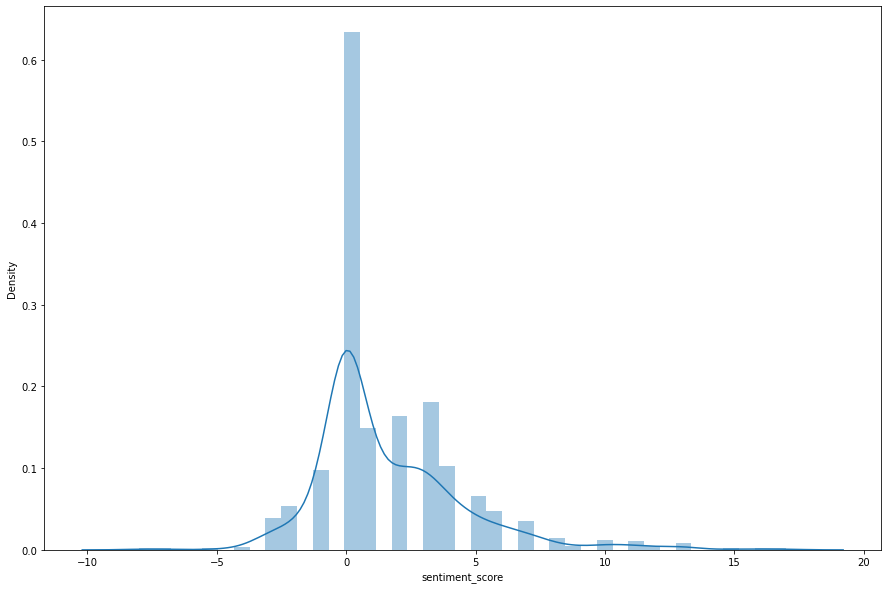

In [54]:
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sentences_df['sentiment_score']);

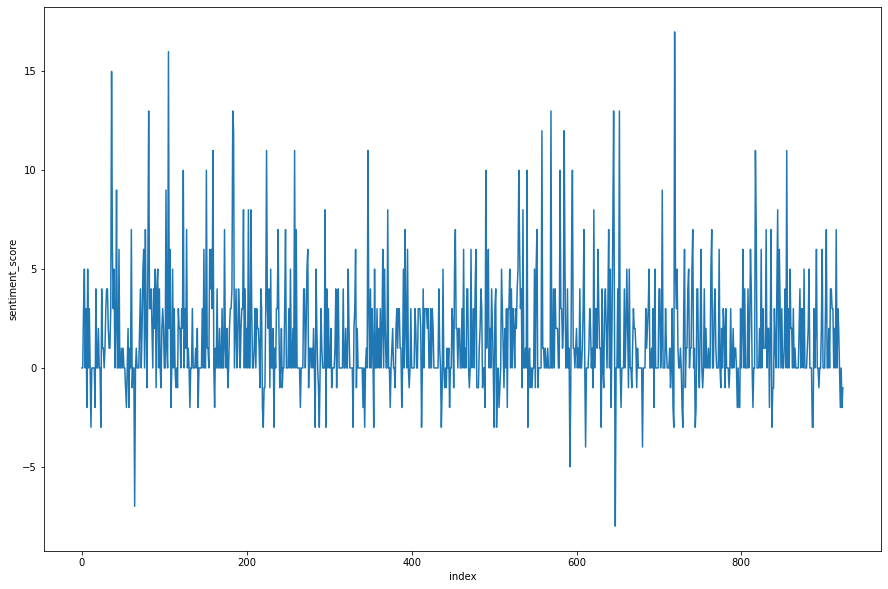

In [55]:
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_score',x='index',data=sentences_df);

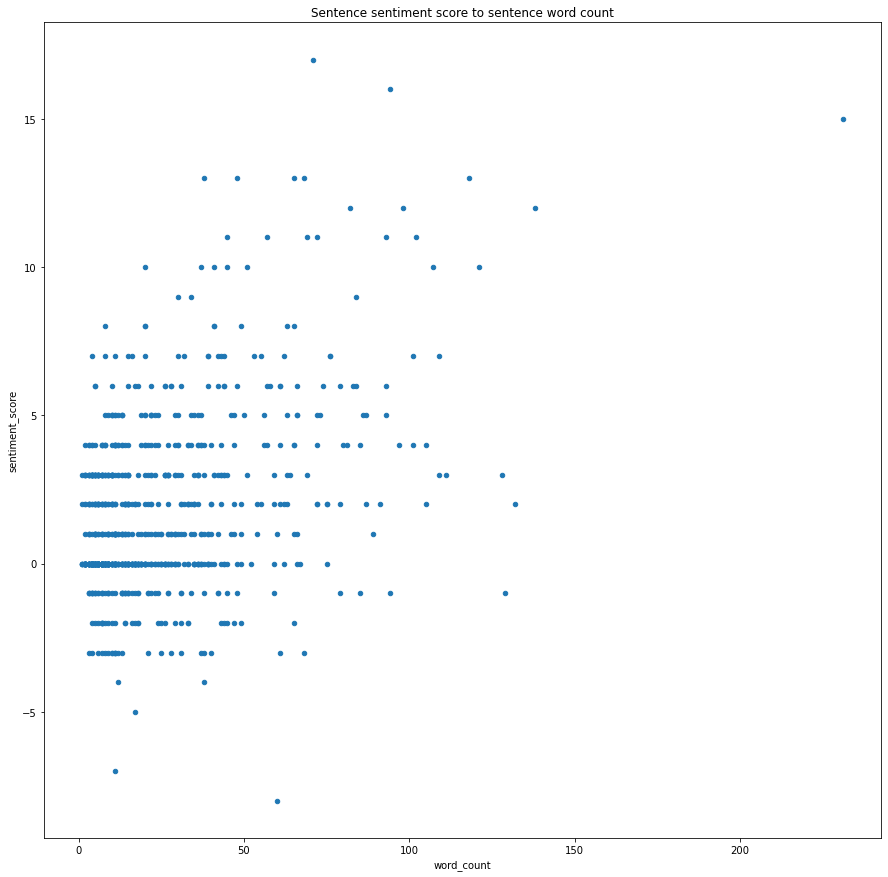

In [56]:
sentences_df.plot.scatter(x='word_count', y='sentiment_score', figsize=(15,15), title='Sentence sentiment score to sentence word count');